# OpenCV Library


Estimated time needed: **60** minutes


<h2>Objectives</h2>


Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing and transmitting, and gathering images through the internet. 
Python is an excellent choice as it has many image processing tools, computer vision, and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and the internet.
A digital image is simply a file on your computer. In this lab, you will gain an understanding  of these files and learn to work with these files with some popular libraries


<ul>
    <li><a href='#PIL'>Open CV </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
        </ul>
    </li>
    
</ul>


----


Download the image for the lab:


In [8]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png  

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


First, let's define a helper function to concatenate two images side-by-side. You will need to understand this code this moment, but this function will be used repeatedly in this tutorial to showcase the results.


In [9]:
from PIL import Image  # Nhập thư viện PIL để thao tác với ảnh
def get_concat_h(im1, im2):  # Hàm ghép 2 ảnh im1 và im2 theo chiều ngang
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))  # Tạo ảnh mới, kênh RGB, rộng = im1+im2, cao = im1
    dst.paste(im1, (0, 0))          # Dán ảnh im1 vào góc trên trái của ảnh mới
    dst.paste(im2, (im1.width, 0))  # Dán ảnh im2 vào bên phải im1
    return dst                       # Trả về ảnh đã ghép


## Image Files and Paths  


An image is stored as a file on your computer. Below, we define `my_image` as the filename of a file in this directory.


In [10]:
my_image = "lenna.png" # Lưu tên file ảnh vào biến my_image

Filename consists of two parts, the name of the file and the extension, separated by a full stop (`.`). The extension specifies the format of the image. There are two popular image formats -- Joint Photographic Expert Group image (or `.jpg`, `.jpeg`) and Portable Network Graphics (or `.png`). These file types make it simpler to work with images. For example, it compresses the image using sine/cosine approximations, taking less spaces on your drive to store the image.


Image files are stored in the file system of your computer. The location of it is specified using a "path", which is often unique. You can find the path of your current working directory with Python's `os` module. The `os` module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory. 


In [11]:
import os                 # Nhập thư viện os để thao tác với hệ thống file
cwd = os.getcwd()         # Lấy thư mục hiện tại đang làm việc (current working directory)
cwd                       # In ra đường dẫn thư mục hiện tại

'f:\\HỌC TẬP\\Thị giác máy tính\\Thực hành\\2374802010086_NguyenVanTungDuong_Lab_CV_0101\\Lab 1'

The "path" to an image can be found using the following line of code.


In [12]:
#image_path = os.path.join(cwd, my_image)
image_path = "lenna.png".encode('utf-8').decode() # Chuyển tên file 'lenna.png' sang dạng UTF-8 tránh lỗi kí tự
image_path # in ra đường dẫn

'lenna.png'

## Load in Image in Python


OpenCV is a library used for computer vision. It has more functionality than the `PIL` library but is more difficult to use. We can import `OpenCV` as follows:


In [13]:
import cv2 # Nhập thư viện OpenCV để xử lý ảnh và video

The <code>imread()</code> method loads an image from the specified file, the input is the <code>path</code> of the image to be read (just like PIL), the <code>flag</code> paramter specifies how the image should be read, and the default value is <code>cv2.IMREAD_COLOR</code>.


In [14]:
image = cv2.imread(my_image)  # Đọc ảnh từ file my_image bằng OpenCV, lưu vào biến image


The result is a numpy array with intensity values as 8-bit unsigned integers. 


In [15]:
type(image)  # Kiểm tra kiểu dữ liệu của biến image


numpy.ndarray

We can get the shape of the array from the `shape` attribute.


In [16]:
image.shape # Kiểm tra kích thước mảng ảnh: (chiều cao, chiều rộng, số kênh màu)

(512, 512, 3)

The shape is the same as the PIL array, but there are several differences; for example, PIL returns in (R, G, B) format whereas OpenCV returns in (B, G, R) format.


Each pixel could take on 256 possible values as intensity, ranging from 0 to 255, with 0 being the lowest intensity and 255 being the highest. The maximum and minimum intensity values of an image can be obtained, respectively, by calling:


In [17]:
image.max()  # Lấy giá trị pixel lớn nhất trong toàn bộ ảnh (cường độ sáng cao nhất)

np.uint8(255)

and


In [18]:
image.min()  # Lấy giá trị pixel nhỏ nhất trong toàn bộ ảnh (cường độ tối nhất)

np.uint8(3)

##  Plotting an Image 


You can use OpenCV's `imshow` function to open the image in a new window, but this may give you some issues in Jupyter:


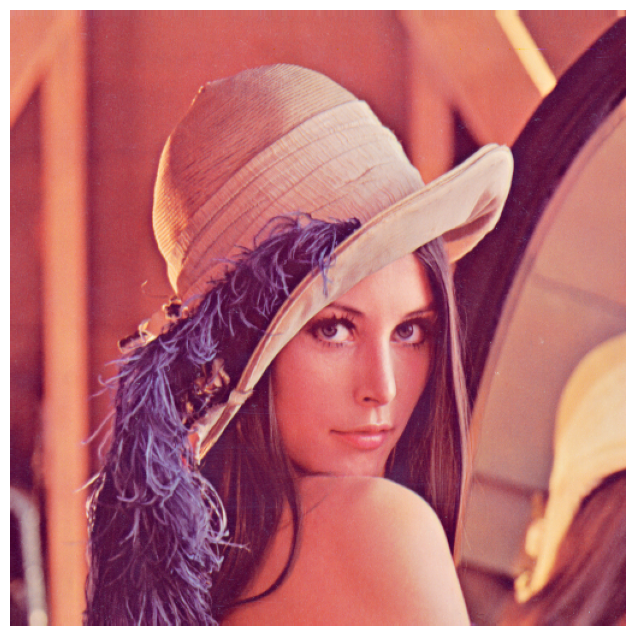

In [19]:
# cv2.imshow('image', image)   # Hiển thị ảnh trong cửa sổ mới với tiêu đề 'image'
# cv2.waitKey(0)               # Chờ nhấn phím bất kỳ để tiếp tục
# cv2.destroyAllWindows()      # Đóng tất cả cửa sổ hiển thị của OpenCV

import cv2
import matplotlib.pyplot as plt

image = cv2.imread('lenna.png')  # Đọc ảnh bằng OpenCV

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # OpenCV đọc ảnh theo định dạng BGR, đổi sang RGB để hiển thị đúng màu

# Hiển thị ảnh trong notebook bằng Matplotlib
plt.figure(figsize=(8,8))
plt.imshow(image_rgb)
plt.axis('off')  # Tắt trục tọa độ
plt.show()


You can also use the `imshow` function from the `matplotlib` library:


In [20]:
import matplotlib.pyplot as plt  # Nhập thư viện Matplotlib để vẽ và hiển thị ảnh, biểu đồ

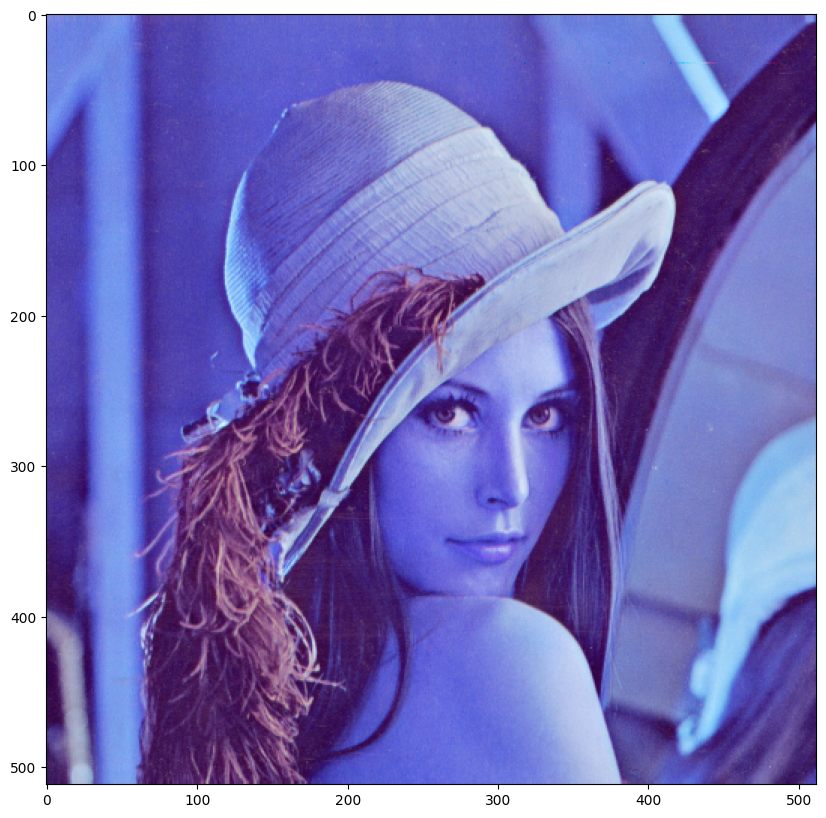

In [21]:
plt.figure(figsize=(10,10))  # Tạo khung vẽ mới, kích thước 10x10 
plt.imshow(image)             # Hiển thị ảnh 'image' trên khung vẽ
plt.show()                    # Hiển thị khung vẽ ra màn hình

The image output doesn't look natural. This is because the order of RGB Channels are different. We can change the color space with conversion code and the function `cvtColor` from the `cv2` library:


In [22]:
new_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
# Chuyển ảnh từ định dạng BGR (OpenCV) sang RGB để hiển thị đúng màu với Matplotlib


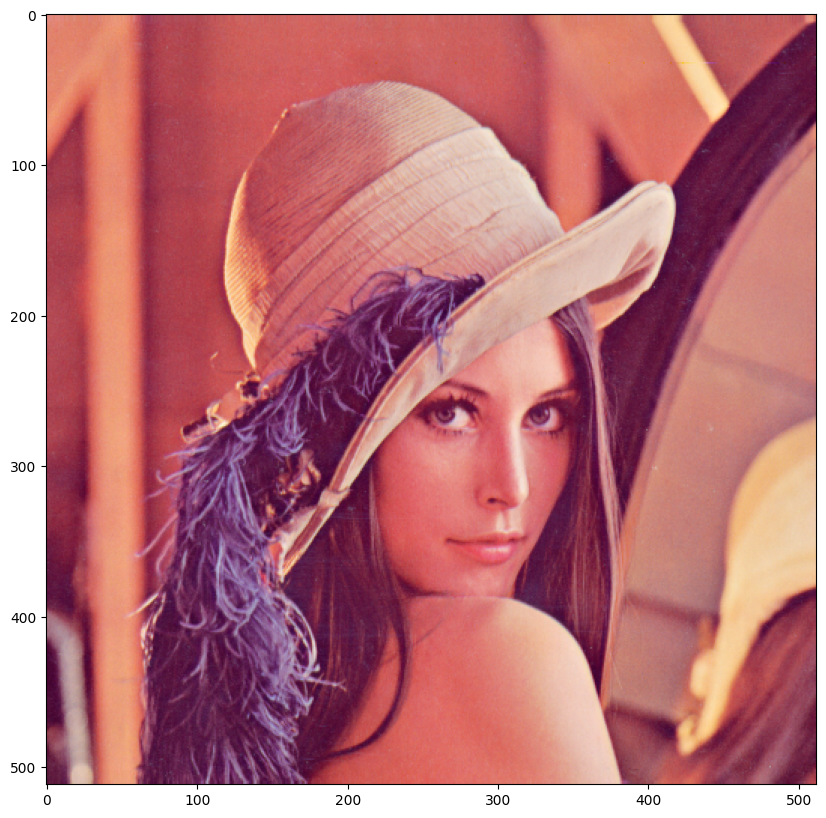

In [23]:
plt.figure(figsize=(10,10))  # Tạo khung vẽ mới, kích thước 10x10 inch
plt.imshow(new_image)         # Hiển thị ảnh new_image đã chuyển sang RGB
plt.show()                    # Hiển thị khung vẽ ra màn hình

You can also load the image using its path, this comes in handy if the image is not in your working directory:


In [ ]:
image = cv2.imread(image_path)  # Đọc ảnh từ đường dẫn image_path bằng OpenCV, lưu vào biến image
image.shape                     # In ra kích thước của ảnh: (chiều cao, chiều rộng, số kênh màu)

(512, 512, 3)

You can save the image as in `jpg` format.


In [ ]:
cv2.imwrite("lenna.jpg", image)  # Lưu ảnh image thành file 'lenna.jpg' trên ổ cứng

True

### Grayscale Images


Grayscale images have pixel values representing the amount of light or intensity. Light shades of gray have a high-intensity darker shades have a lower intensity. White has the highest intensity, and black the lowest. We can convert an image to Gray Scale using a color conversion code and the function <code>cvtColor</code>.


The code for RGB to gray is <code>cv2.COLOR_BGR2GRAY</code>, we apply the function:


In [ ]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  
# Chuyển ảnh màu (BGR) sang ảnh xám (grayscale)

The image array has only two dimensions, i.e. only one color channel:


In [ ]:
image_gray.shape  # Kiểm tra kích thước ảnh xám, sẽ trả về (chiều cao, chiều rộng)

(512, 512)

We can plot the image using `imshow` but we have to specify the color map is gray:


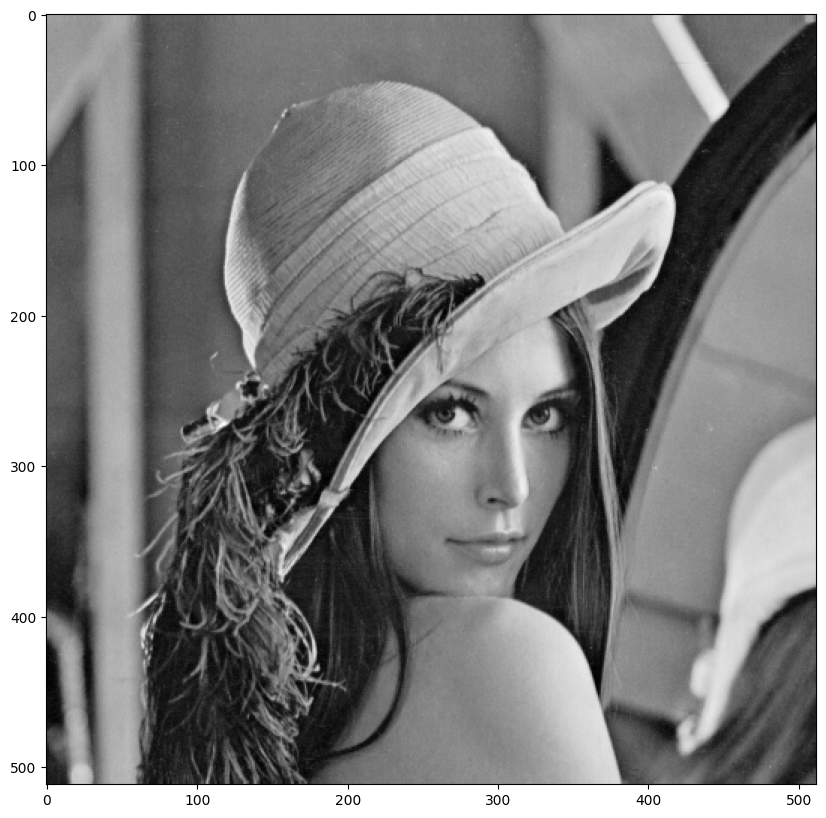

In [49]:
plt.figure(figsize=(10, 10))          # Tạo khung vẽ mới, kích thước 10x10 inch
plt.imshow(image_gray, cmap='gray')   # Hiển thị ảnh xám, dùng colormap 'gray' để hiển thị đúng cường độ
plt.show()                             # Hiển thị khung vẽ ra màn hình

We can save the image as a grayscale image, let's save it as a `jpg` as well, in the working directory.


In [ ]:
cv2.imwrite('lena_gray_cv.jpg', image_gray)  
# Lưu ảnh xám image_gray ra file 'lena_gray_cv.jpg' trên ổ cứng

True

You can also load in a grayscale image we have to set <code>flag</code> parameter to gray color conversation code: <code>cv2.COLOR_BGR2GRAY</code>:


In [ ]:
im_gray = cv2.imread('barbara.png', cv2.IMREAD_GRAYSCALE)  
# Đọc ảnh 'barbara.png' trực tiếp dưới dạng xám (grayscale) bằng OpenCV

We can plot the image:


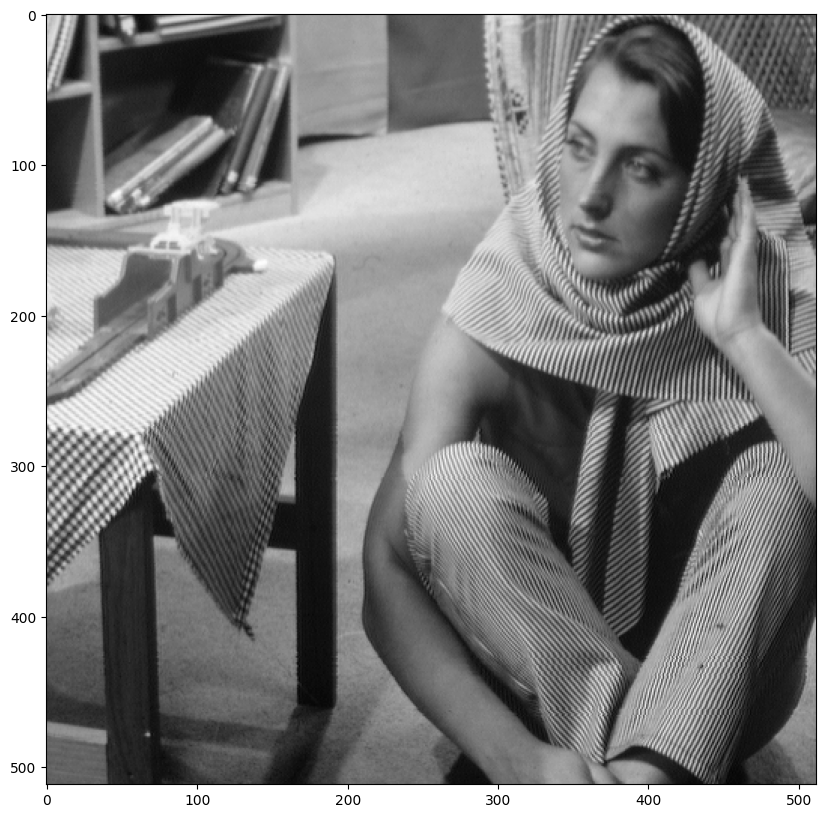

In [ ]:
plt.figure(figsize=(10,10))        # Tạo khung vẽ mới, kích thước 10x10 
plt.imshow(im_gray, cmap='gray')    # Hiển thị ảnh im_gray dưới dạng đen-trắng (grayscale)
plt.show()                          # Hiển thị khung vẽ ra màn hình

### Color Channels  


We can also work with the different color channels. Consider the following image:


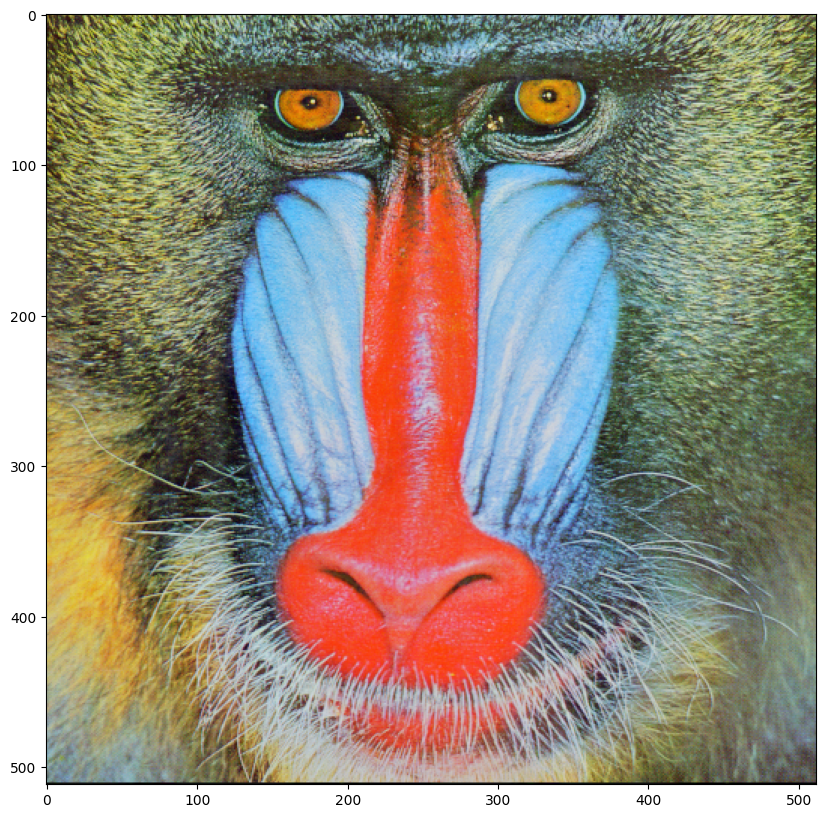

In [50]:
baboon = cv2.imread('baboon.png')                     # Đọc ảnh baboon.png bằng OpenCV, ảnh màu BGR
plt.figure(figsize=(10,10))                           # Tạo khung vẽ mới, kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))  # Chuyển từ BGR sang RGB để hiển thị màu đúng, rồi vẽ ảnh
plt.show()                                           # Hiển thị ảnh ra màn hình

We can obtain the different RGB colors and assign them to the variables <code>blue</code>, <code>green</code>, and <code>red</code>, in (B, G, R) format.


In [ ]:
blue, green, red = baboon[:, :, 0], baboon[:, :, 1], baboon[:, :, 2]  
# Tách 3 kênh màu từ ảnh baboon: 


We can concatenate each image channel the images using the function <code>vconcat</code>.


In [51]:
im_bgr = cv2.merge([blue, green, red])  # Ghép 3 kênh riêng thành ảnh màu BGR

Plotting the color image next to the red channel in grayscale, we see that regions with red have higher intensity values.


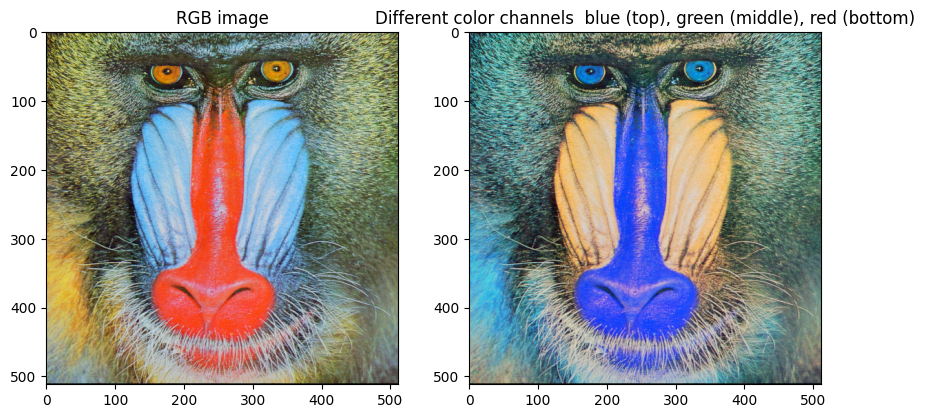

In [55]:
plt.figure(figsize=(10,10))  # Tạo khung vẽ 10x10 inch

plt.subplot(121)  # Chia khung vẽ thành 1 hàng 2 cột, chọn vị trí 1
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))  # Hiển thị ảnh màu RGB
plt.title("RGB image")  # title

plt.subplot(122)  # Chọn vị trí 2 trong khung vẽ
plt.imshow(im_bgr, cmap='gray')  # Hiển thị ảnh ghép 3 kênh theo chiều dọc, dùng colormap 'gray'
plt.title("Different color channels  blue (top), green (middle), red (bottom)")  # title 

plt.show()  # Hiển thị toàn bộ khung vẽ


### Indexing  


We can use numpy slicing. For example, we can return the first 256 rows corresponding to the top half of the image:


In [ ]:
rows = 256 # Số hàng (pixels) muốn lấy từ ảnh

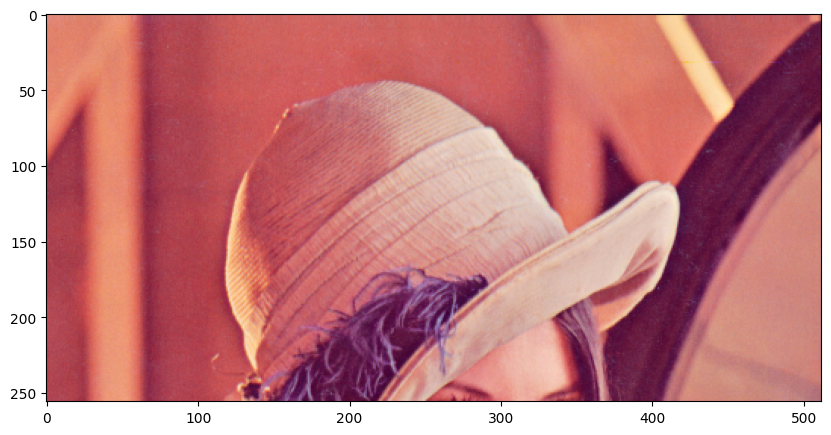

In [56]:
plt.figure(figsize=(10,10))          # Tạo khung vẽ mới, kích thước 10x10 inch
plt.imshow(new_image[0:rows, :, :])  # Hiển thị phần ảnh từ hàng 0 đến hàng 255, tất cả cột và tất cả kênh màu
plt.show()                            # Hiển thị khung vẽ ra màn hình

We can also return the first 256 columns corresponding to the first half of the image:


In [58]:
columns = 256 # Số cột (pixels) muốn lấy từ ảnh

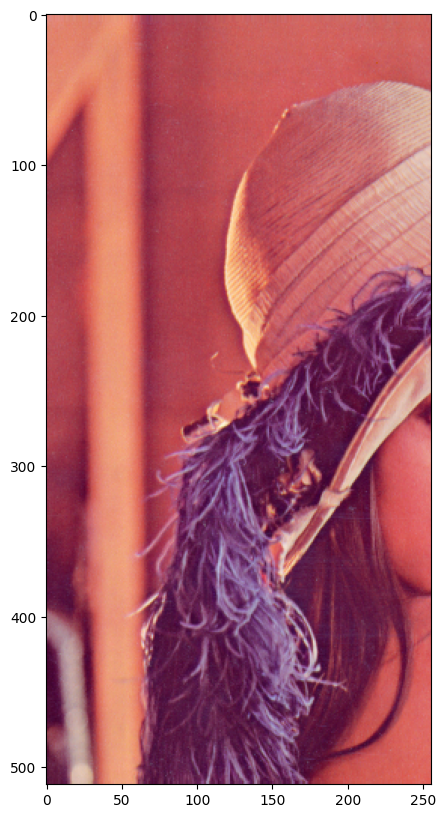

In [57]:
plt.figure(figsize=(10,10))             # Tạo khung vẽ mới, kích thước 10x10 inch
plt.imshow(new_image[:, 0:columns, :])  # Hiển thị phần ảnh từ cột 0 đến cột 255, tất cả hàng và tất cả kênh màu
plt.show()                               # Hiển thị khung vẽ ra màn hình

If you want to reassign an array to another variable, you should use the `copy` method (we will cover this in the next section).


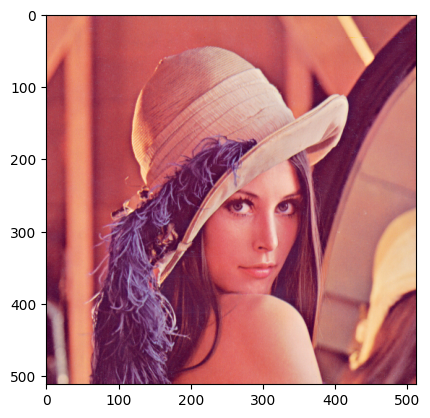

In [40]:
A = new_image.copy()
plt.imshow(A)
plt.show()

If we do not apply the method `copy()`, the variable will point to the same location in memory. Consider the variable `B` below, if we set all values of array `A` to zero, since `A` and `B` points to the same object in the memory, `B` will also have all-zero elements:


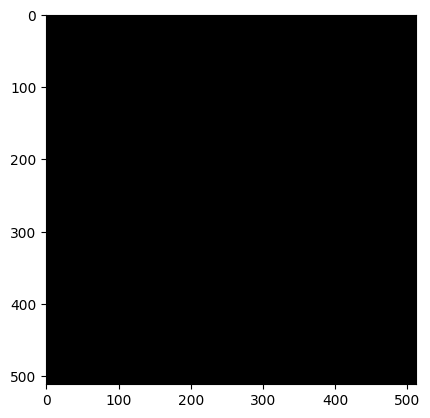

In [59]:
B = A              # Gán B tham chiếu đến cùng mảng với A (không copy dữ liệu)
A[:, :, :] = 0     # Gán tất cả pixel trong A = 0 (đen hoàn toàn)
plt.imshow(B)      # Hiển thị ảnh B, sẽ thấy ảnh cũng bị đen vì B tham chiếu cùng mảng với A
plt.show()         # Hiển thị khung vẽ ra màn hình

We can also manipulate elements using indexing. In the following piece of code, we create a new array `baboon_red` and set all but the red color channels to zero. Therefore, when we display the image, it appears red:


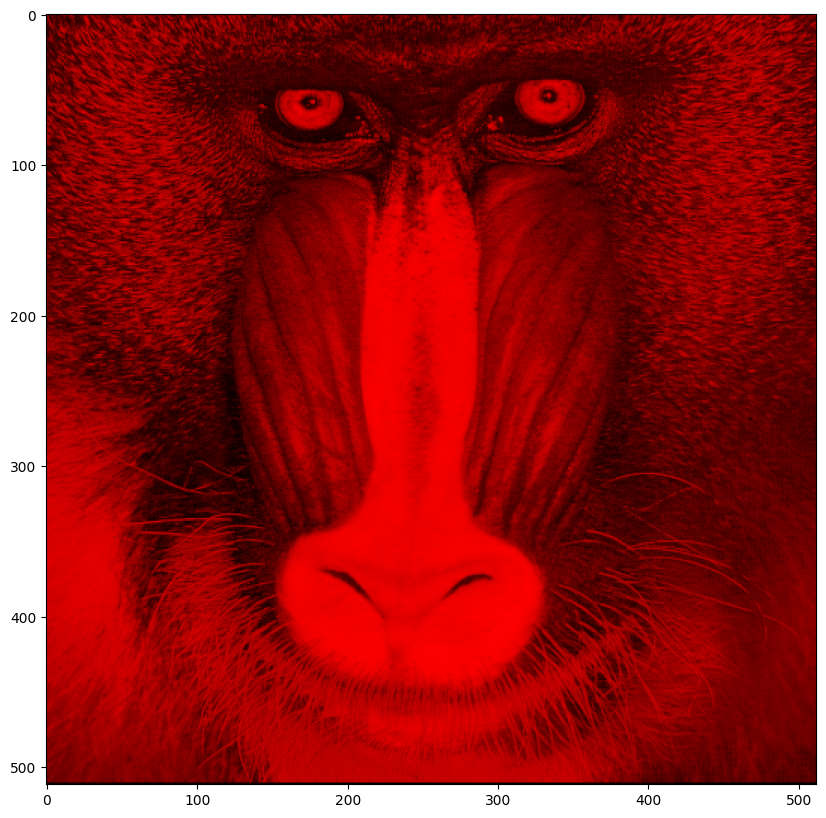

In [60]:
baboon_red = baboon.copy()                       # Tạo bản sao của ảnh baboon để chỉnh sửa mà không ảnh hưởng ảnh gốc
baboon_red[:, :, 0] = 0                          # Xóa kênh xanh dương (Blue) → chỉ còn Green & Red
baboon_red[:, :, 1] = 0                          # Xóa kênh xanh lá (Green) → chỉ còn Red
plt.figure(figsize=(10, 10))                     # Tạo khung vẽ mới, kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon_red, cv2.COLOR_BGR2RGB))  # Chuyển BGR → RGB để hiển thị đúng màu
plt.show()                                       # Hiển thị ảnh

We can do the same for blue:  


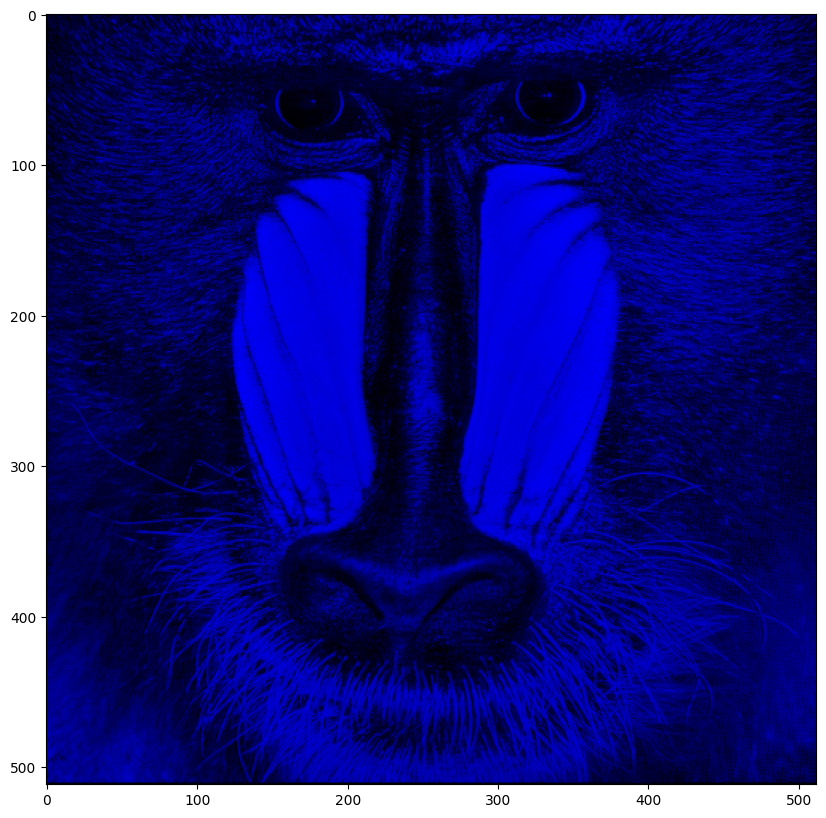

In [61]:
baboon_blue = baboon.copy()                      # Tạo bản sao ảnh baboon để chỉnh sửa mà không ảnh hưởng ảnh gốc
baboon_blue[:, :, 1] = 0                         # Xóa kênh xanh lá (Green)
baboon_blue[:, :, 2] = 0                         # Xóa kênh đỏ (Red), chỉ còn kênh xanh dương (Blue)
plt.figure(figsize=(10, 10))                     # Tạo khung vẽ mới, kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))  # Chuyển BGR → RGB để hiển thị màu đúng
plt.show()                                       # Hiển thị ảnh

We can do the same for green:


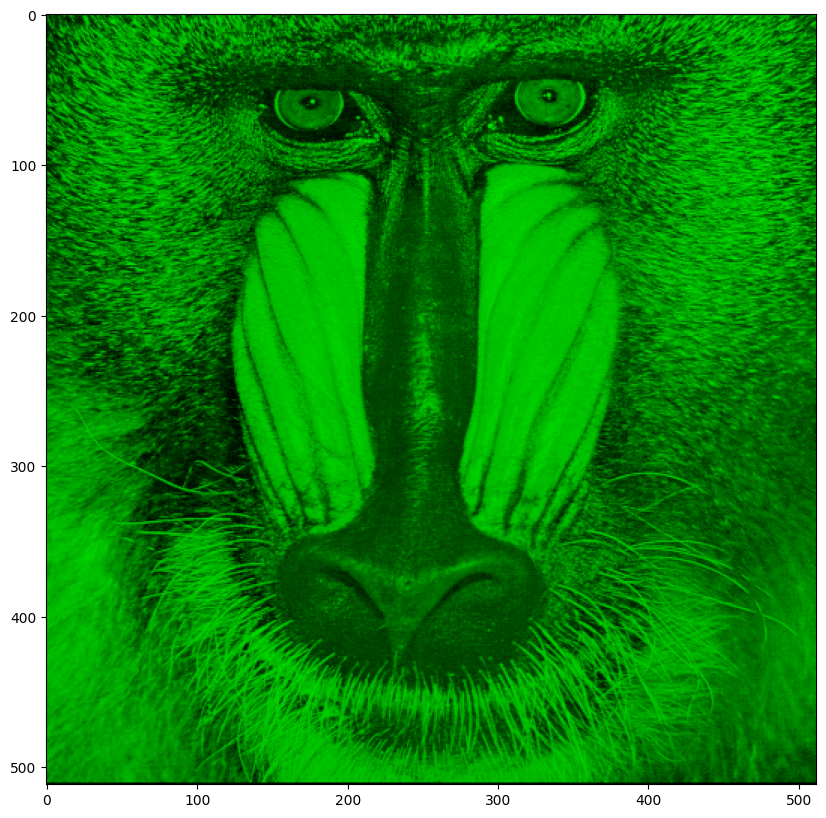

In [62]:
baboon_green = baboon.copy()                      # Tạo bản sao ảnh baboon để chỉnh sửa mà không ảnh hưởng ảnh gốc
baboon_green[:, :, 0] = 0                         # Xóa kênh xanh dương (Blue)
baboon_green[:, :, 2] = 0                         # Xóa kênh đỏ (Red), chỉ còn kênh xanh lá (Green)
plt.figure(figsize=(10,10))                       # Tạo khung vẽ mới, kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon_green, cv2.COLOR_BGR2RGB))  # Chuyển BGR → RGB để hiển thị màu đúng
plt.show()                                        # Hiển thị ảnh

In [63]:
image = cv2.imread('baboon.png')  # Đọc ảnh baboon.png bằng OpenCV, lưu dưới dạng mảng NumPy (BGR)

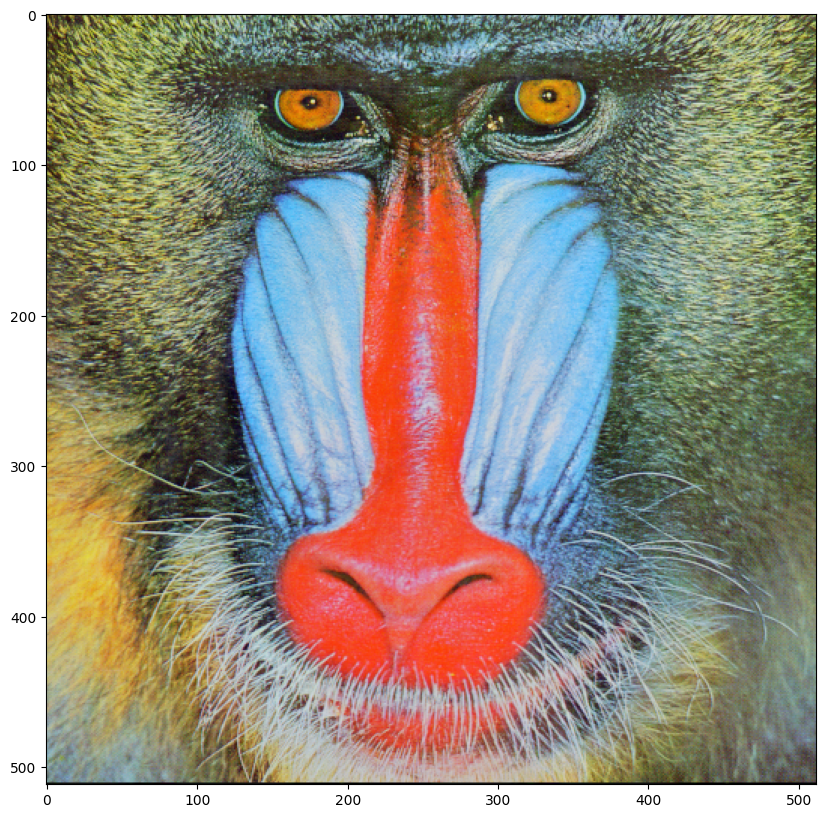

In [64]:
plt.figure(figsize=(10,10))                          # Tạo khung vẽ mới, kích thước 10x10 inch
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))   # Chuyển ảnh từ BGR → RGB và hiển thị
plt.show()                                           # Hiển thị khung vẽ ra màn hình

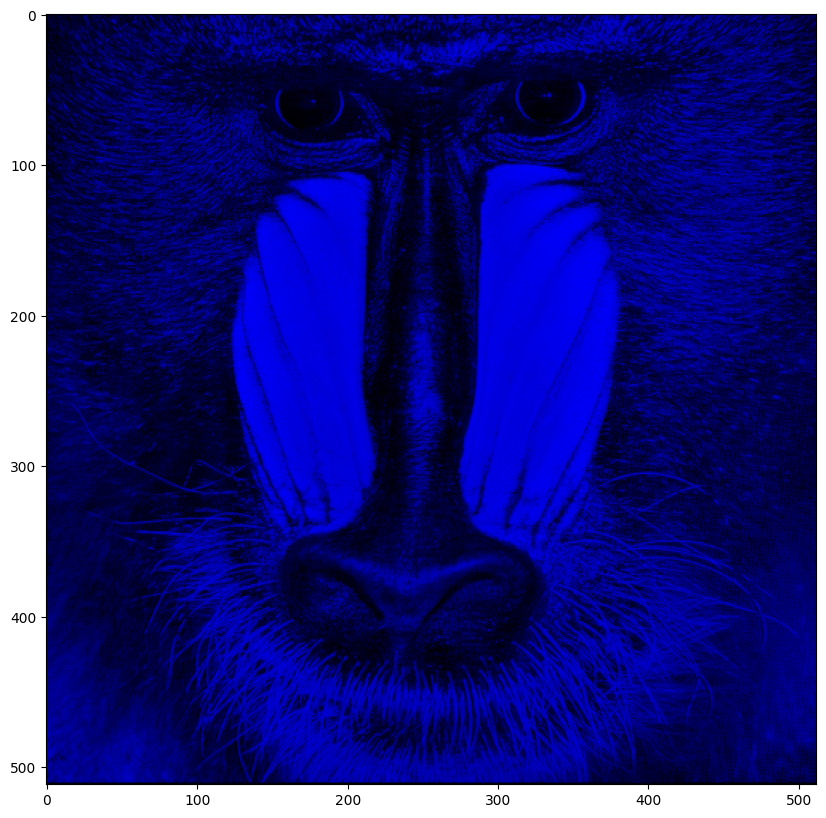

In [65]:
image = cv2.imread('baboon.png')              # Đọc ảnh baboon.png bằng OpenCV, lưu dưới dạng mảng NumPy (BGR)
baboon_blue = image.copy()                     # Tạo bản sao để chỉnh sửa mà không ảnh hưởng ảnh gốc
baboon_blue[:, :, 1] = 0                       # Xóa kênh xanh lá (Green)
baboon_blue[:, :, 2] = 0                       # Xóa kênh đỏ (Red), chỉ còn kênh xanh dương (Blue)
plt.figure(figsize=(10,10))                     # Tạo khung vẽ 10x10 inch
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))  # Chuyển BGR → RGB và hiển thị
plt.show()                                     # Hiển thị ảnh

### Question 1: 
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a OpenCV Image object called `baboon_blue`, convert the image from BGR format to RGB format, get the blue channel out of it, and finally plot the image


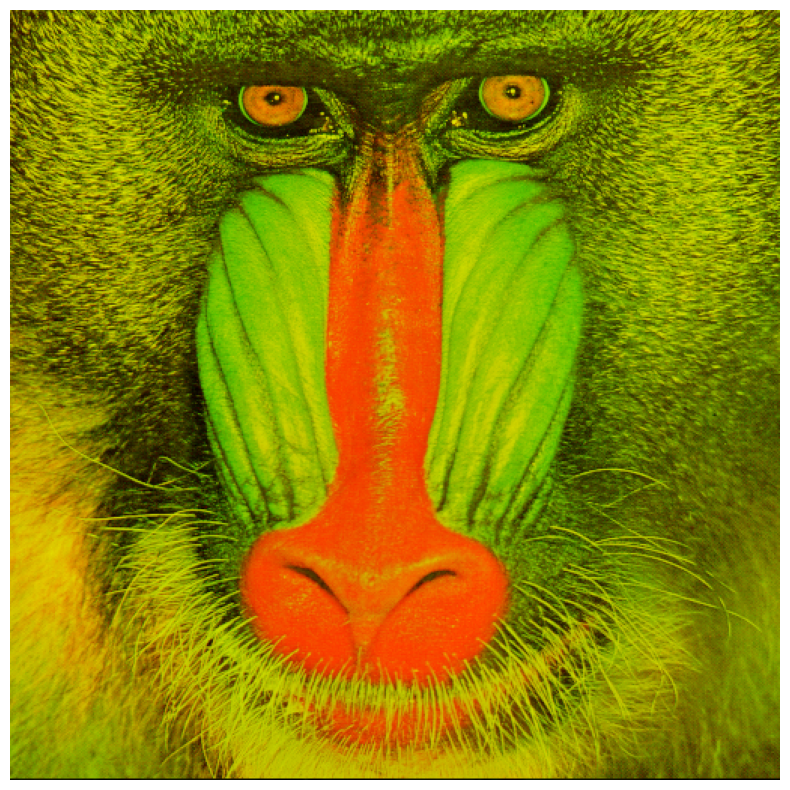

In [72]:
import cv2
import matplotlib.pyplot as plt

image = cv2.imread('baboon.png')
baboon_blue = image.copy()
baboon_blue[:, :, 0] = 0   # Đặt kênh Blue = 0, giữ Red và Green

baboon_blue_rgb = cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.imshow(baboon_blue_rgb)
plt.axis('off')
plt.show()


Double-click **here** for a hint.

<!-- The hint is below:

baboon_blue[:,:,2] = 0

-->


Double-click **here** for the solution.

<!-- The answer is below:

baboon_blue=cv2.imread('baboon.png')
baboon_blue=cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)
baboon_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->


## So sánh 2 thư viện PIL và CV

### Tóm tắt nhanh
**PIL/Pillow:** Thư viện xử lý ảnh đơn giản, nhẹ, dễ học - phù hợp cho chỉnh sửa ảnh cơ bản.  
**OpenCV:** Thư viện computer vision mạnh mẽ, nhanh, đầy đủ tính năng - phù hợp cho dự án CV chuyên nghiệp.  

### 1. Hiệu suất và tốc độ
- **PIL/Pillow:** Chậm hơn, được viết bằng Python thuần  
- **OpenCV:** Nhanh gấp nhiều lần (tối ưu bằng C/C++), phù hợp xử lý real-time  

### 2. Độ phức tạp
- **PIL/Pillow:** Rất dễ học, API trực quan, thân thiện với người mới  
- **OpenCV:** Phức tạp hơn, cần thời gian làm quen  

### 3. Tính năng chính
**PIL/Pillow - Chỉnh sửa ảnh cơ bản:**
- Mở/lưu ảnh nhiều định dạng  
- Resize, crop, rotate, flip  
- Điều chỉnh màu sắc, độ sáng, độ tương phản  
- Filter đơn giản (blur, sharpen, edge enhance)  
- Vẽ hình và text cơ bản  

**OpenCV - Computer Vision toàn diện:**
- Tất cả tính năng của PIL/Pillow  
- Xử lý video (đọc/ghi/stream)  
- Edge detection (Canny, Sobel)  
- Contour và shape detection  
- Template matching  
- Face detection, object tracking  
- Feature detection (SIFT, ORB, FAST)  
- Machine Learning tích hợp sẵn  

### 4. Điểm khác biệt quan trọng
**Định dạng màu:**  
- PIL/Pillow: RGB (Red-Green-Blue) - chuẩn  
- OpenCV: BGR (Blue-Green-Red) - cần lưu ý khi chuyển đổi  

**Xử lý video:**  
- PIL/Pillow: Không hỗ trợ  
- OpenCV: Hỗ trợ đầy đủ  

**Tích hợp NumPy:**  
- PIL/Pillow: Cần convert `np.array(image)`  
- OpenCV: Trả về NumPy array trực tiếp  

### 5. Kích thước cài đặt
- PIL/Pillow: ~8 MB (rất nhẹ)  
- OpenCV: ~90 MB (đầy đủ) hoặc ~30 MB (base)


<!--
<table>
    <tr>
        <th>Date (YYYY-MM-DD)</th>
        <th>Version</th>
        <th>Changed By</th>
        <th>Change Description</th>
    </tr>
    <tr>
        <td>2020-07-20</td>
        <td>0.2</td>
        <td>Azim</td>
        <td>Modified Multiple Areas</td>
    </tr>
    <tr>
        <td>2020-07-17</td>
        <td>0.1</td>
        <td>Azim</td>
        <td>Created Lab Template</td>
    </tr>
    <tr>
        <td>2021-03-06</td>
        <td>0.3</td>
        <td>Nayef</td>
        <td>Modified some codes</td>
    </tr>
</table>
-->
